In [1]:
import sys; sys.path.insert(0, '..')
from database.dataset import *
import time

import matplotlib.pyplot as plt
from mc_candidate_proposal.hough_mc import HoughCalcificationDetection

db = INBreast_Dataset(
    return_lesions_mask=True,
    level='image',
    partitions=['train', 'validation', 'test'],
    max_lesion_diam_mm=None,
    extract_patches=True,
    extract_patches_method='all',
    keep_just_images_of_lesion_type=True,
    patch_size=224,
    stride=100,
    min_breast_fraction_roi=0.5,
    cropped_imgs=True,
    # use_muscle_mask=True,
    lesion_types=['calcification'],
    ignore_diameter_px=None
)

INFO:numexpr.utils:NumExpr defaulting to 8 threads.


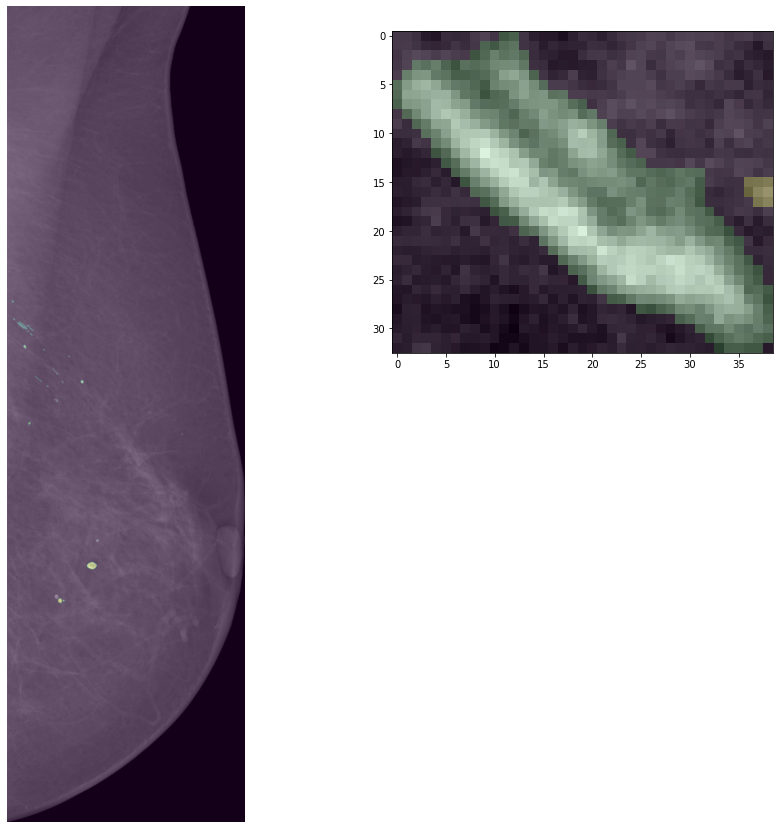

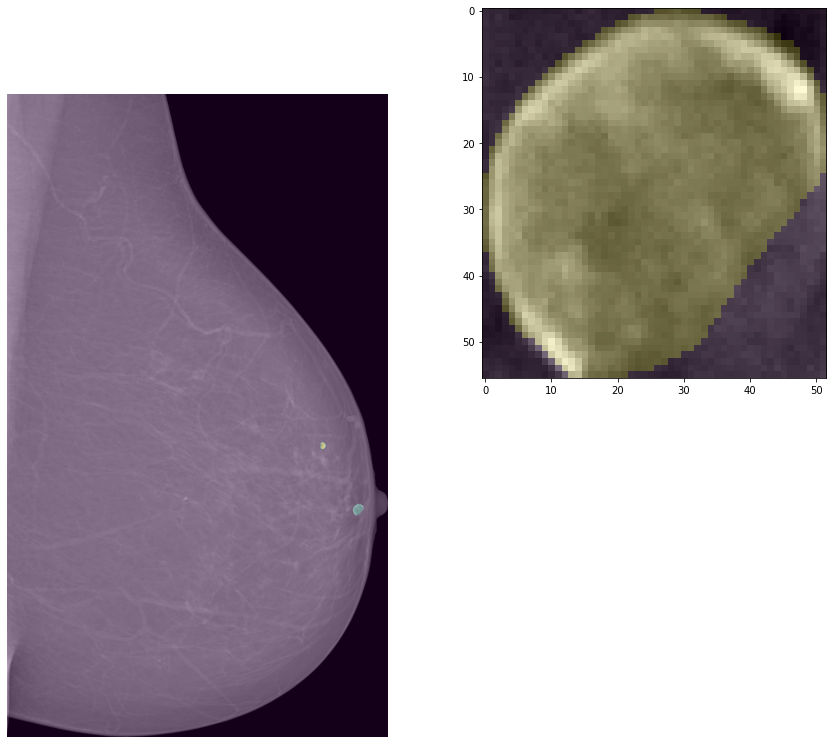

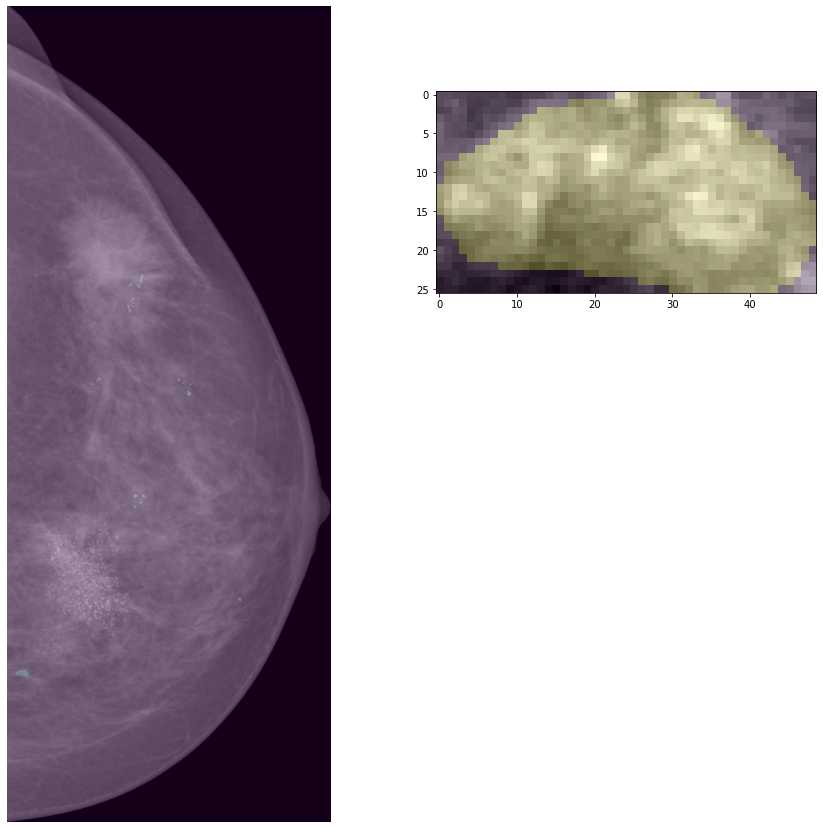

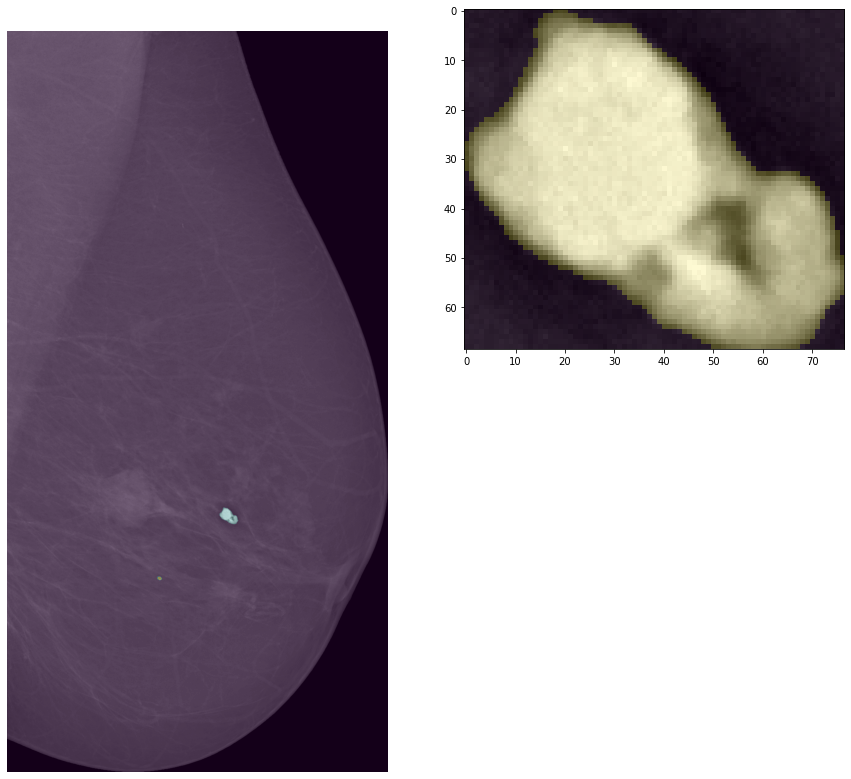

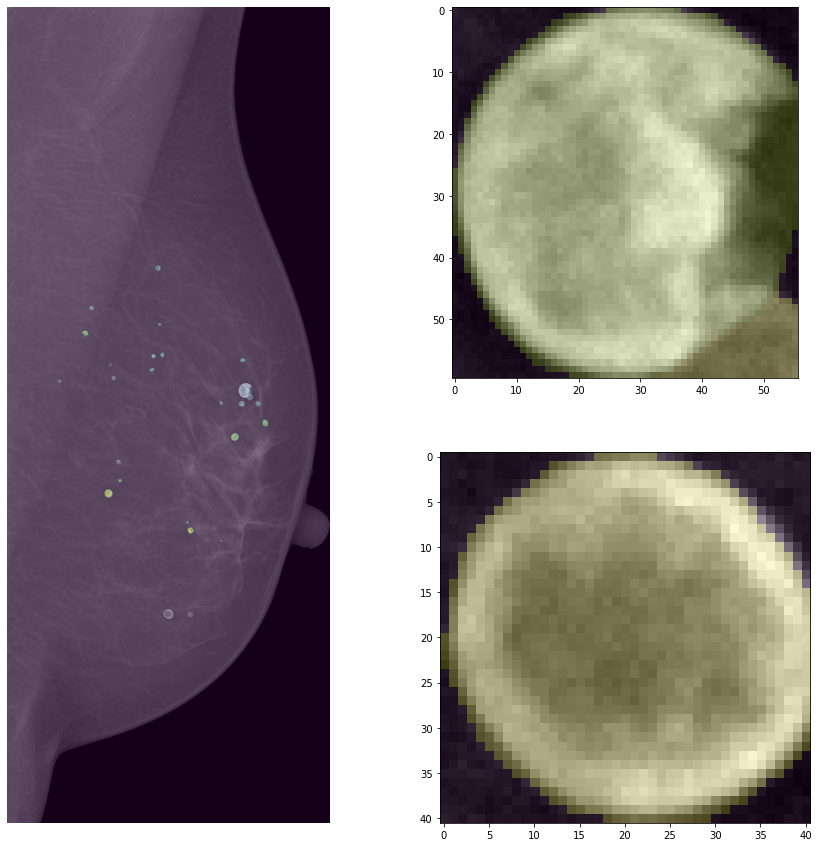

...

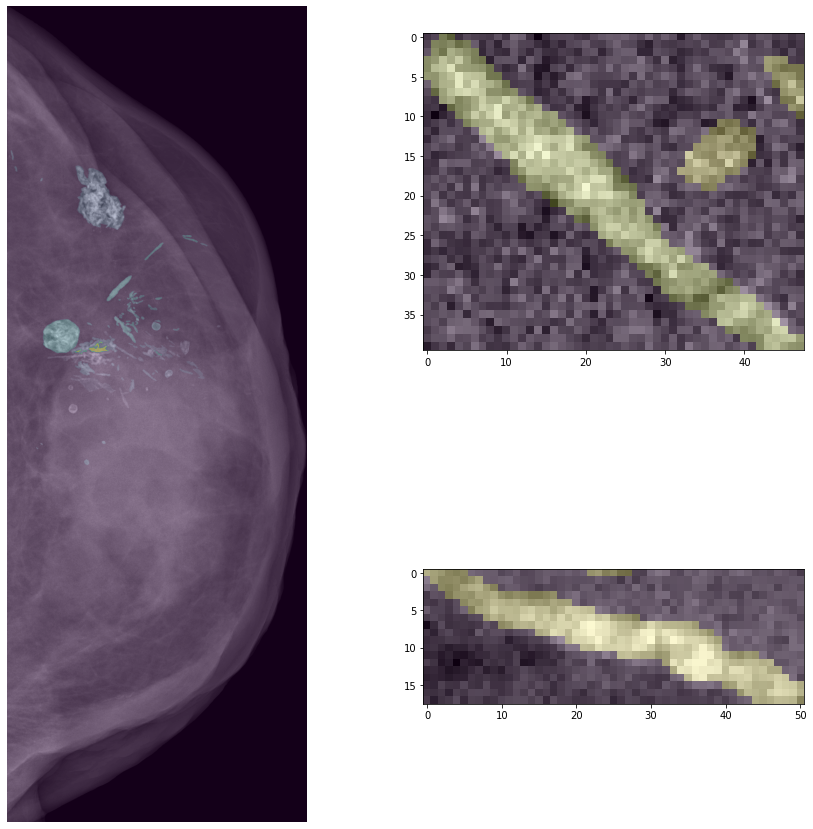

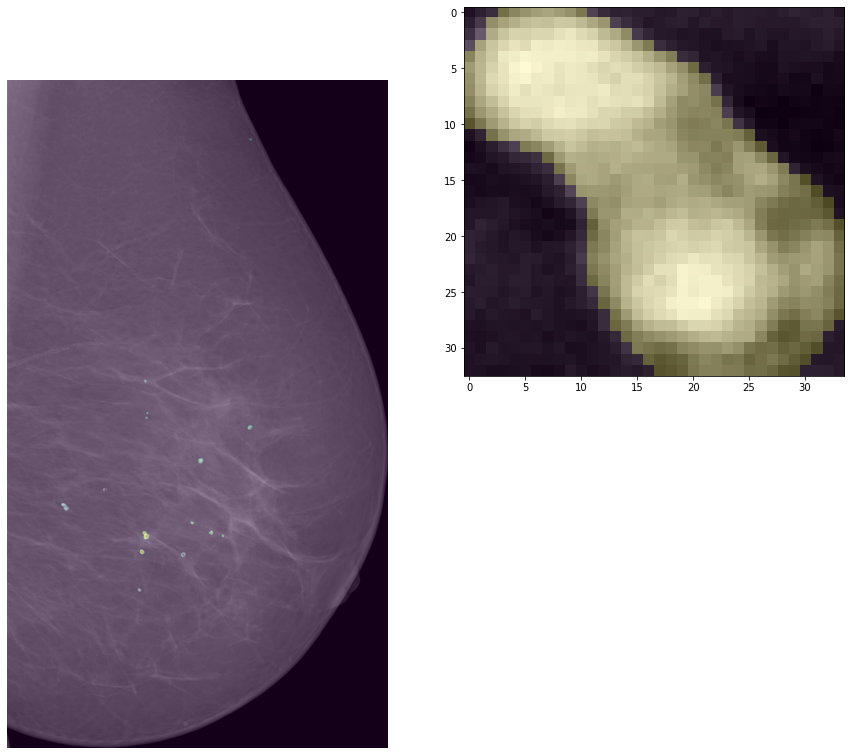

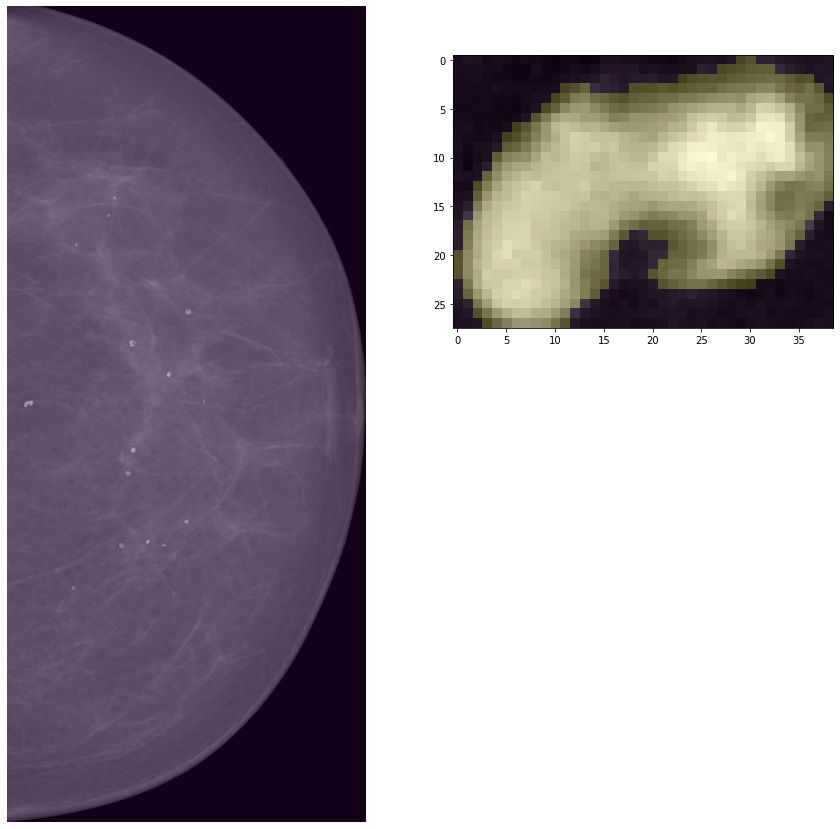

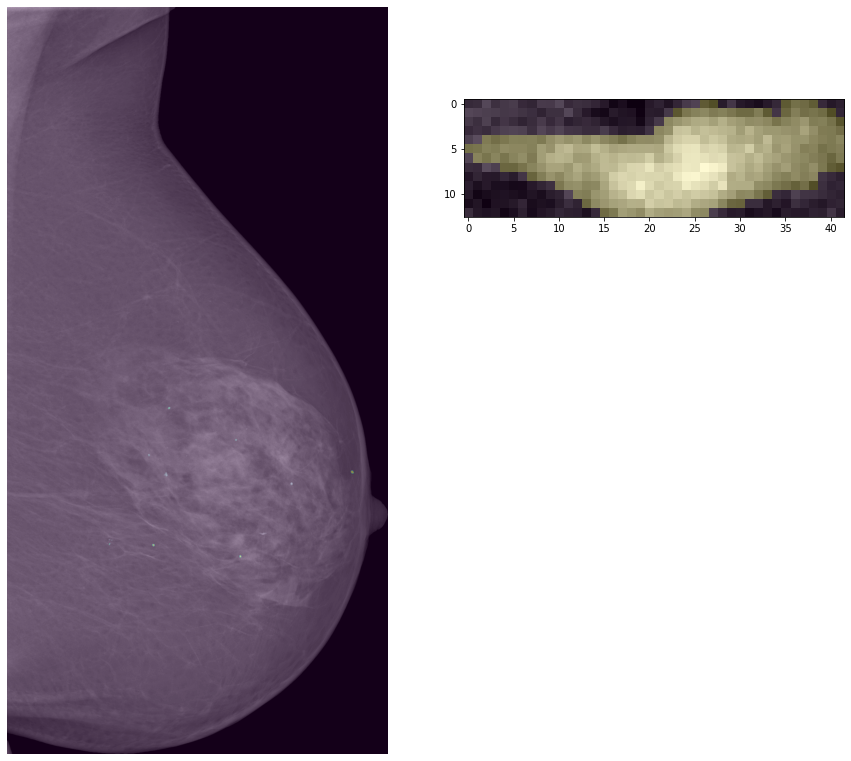

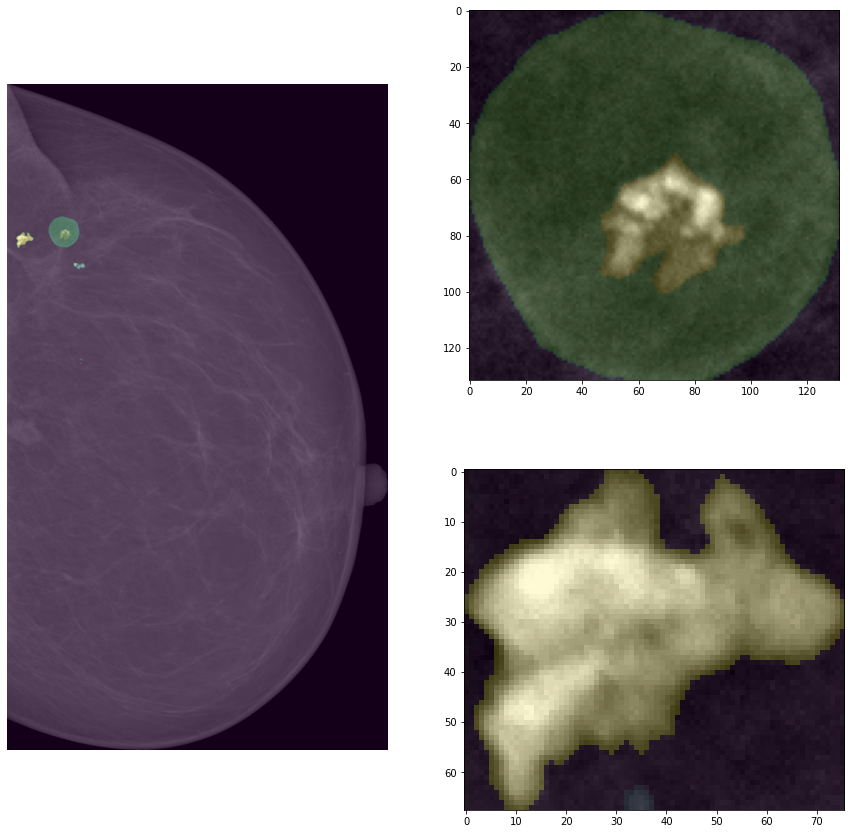

In [2]:
for k, image_id in enumerate(db.rois_df.loc[db.rois_df.radius > 20, 'img_id'].unique()):

    if ((k % 2) == 1):
        continue

    index = db.df.loc[db.df.img_id==image_id].index[0]
    
    img = db[index]['img']
    mask = db[index]['lesion_mask']

    plt.figure(figsize=(15,15))
    plt.subplot(1,2,1)
    plt.imshow(utils.min_max_norm(img, 255).astype('uint8'), cmap='gray')
    plt.imshow(utils.min_max_norm(mask, 255).astype('uint8'), alpha=0.3)
    plt.axis('off')
    
    clust_idx = np.unique(mask)[1:]
    bboxes = []
    
    idxs = db.rois_df.loc[(db.rois_df.radius > 20) & ( db.rois_df.img_id==image_id), 'index_in_image'].tolist()
    
    for i in idxs:
        r, c = np.where(mask == i)
        bbox = ((c.min(), r.min()), (c.max(), r.max()))
        bboxes.append(bbox)
    
    c1 = img[bboxes[0][0][1]:bboxes[0][1][1], bboxes[0][0][0]:bboxes[0][1][0]]
    c1_m = mask[bboxes[0][0][1]:bboxes[0][1][1], bboxes[0][0][0]:bboxes[0][1][0]]

    plt.subplot(2,2,2)
    plt.imshow(c1, cmap='gray')
    plt.imshow(c1_m, alpha=0.2)

    if len(bboxes)>1:
        c2 = img[bboxes[1][0][1]:bboxes[1][1][1], bboxes[1][0][0]:bboxes[1][1][0]]
        c2_m = mask[bboxes[1][0][1]:bboxes[1][1][1], bboxes[1][0][0]:bboxes[1][1][0]]
        plt.subplot(2,2,4)
        plt.imshow(c2, cmap='gray')
        plt.imshow(c2_m, alpha=0.2)
    plt.show()

In [3]:
def reconstruction_by_dialation(
    mask: np.ndarray, rect_size: int = 3, circle_size: int = 20
):
    """Reconstructs image using grayscale dialation
    Args:
        mask (np.ndarray): Image arre of type float or np.uint8
        rect_size (int, optional):
            Size of the SE used for geodesic reconstruction. Defaults to 3.
        circle_size (int, optional):
            Size of the SE used for creating a marker image. Defaults to 20.
    """
    rect_SE = cv2.getStructuringElement(
        cv2.MORPH_RECT, (rect_size, rect_size))
    circle_SE = cv2.getStructuringElement(  
        cv2.MORPH_ELLIPSE, (circle_size, circle_size))

    marker_cur = cv2.morphologyEx(mask, cv2.MORPH_OPEN, circle_SE)
    marker_prev = np.zeros_like(marker_cur)
    while (not (marker_prev == marker_cur).all()):
        marker_prev = marker_cur.copy()
        marker_cur = cv2.min(cv2.dilate(marker_prev, rect_SE), mask)
    return mask - marker_cur

In [7]:
db = INBreast_Dataset(
    return_lesions_mask=True,
    level='image',
    partitions=['train', 'validation', 'test'],
    max_lesion_diam_mm=None,
    extract_patches=True,
    extract_patches_method='all',
    keep_just_images_of_lesion_type=True,
    patch_size=224,
    stride=100,
    min_breast_fraction_roi=0.5,
    cropped_imgs=True,
    # use_muscle_mask=True,
    lesion_types=['cluster'],
    ignore_diameter_px=None
)

20587054


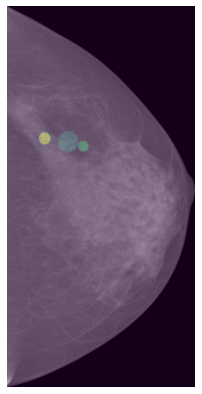

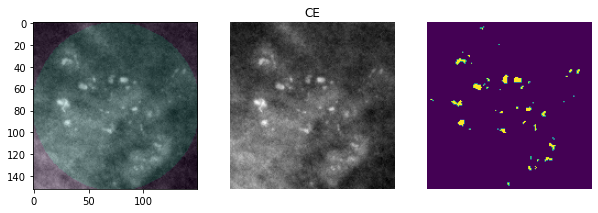

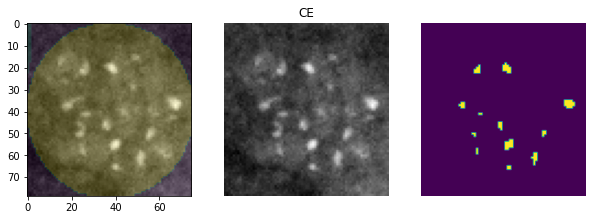

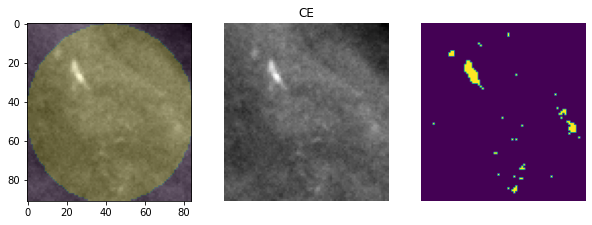

20587080


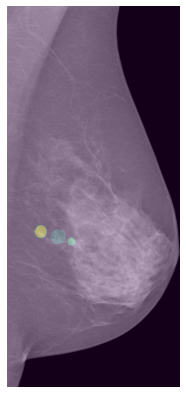

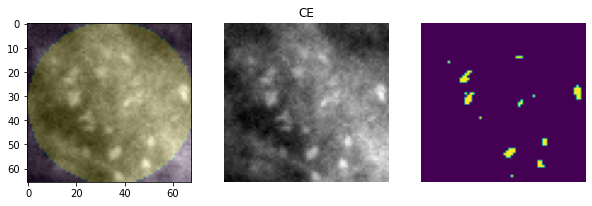

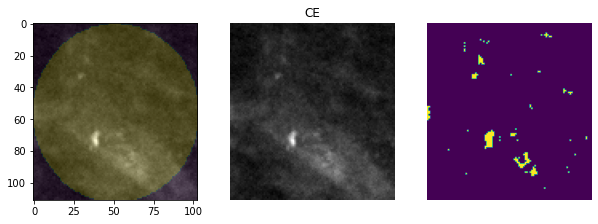

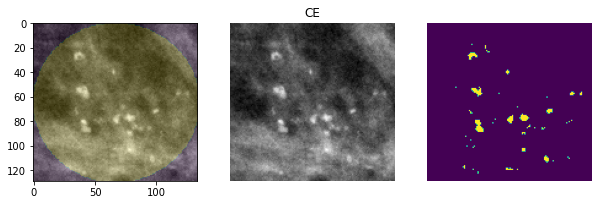

22579870


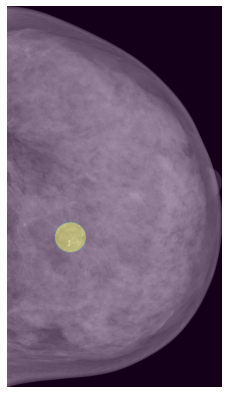

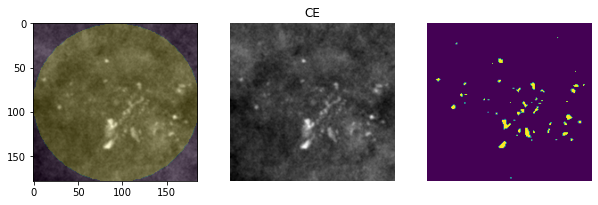

22579916


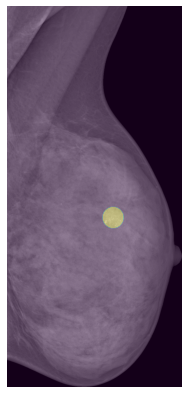

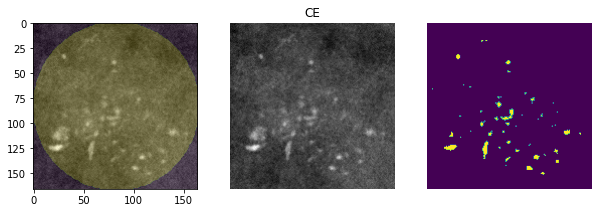

22613918


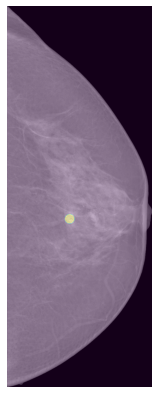

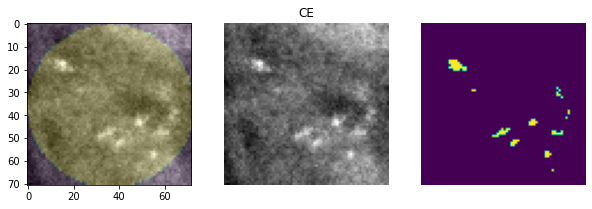

22613970


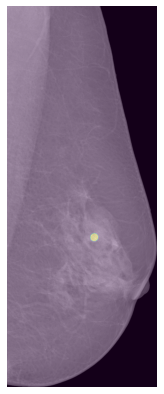

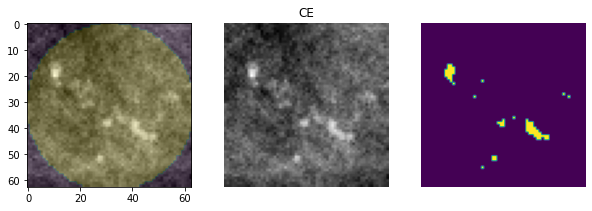

22670465


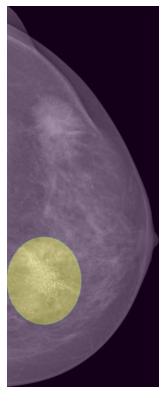

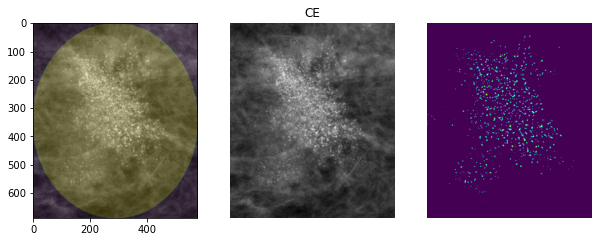

22670511


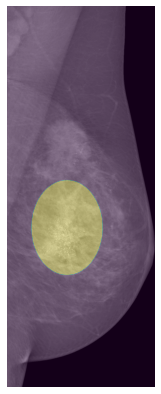

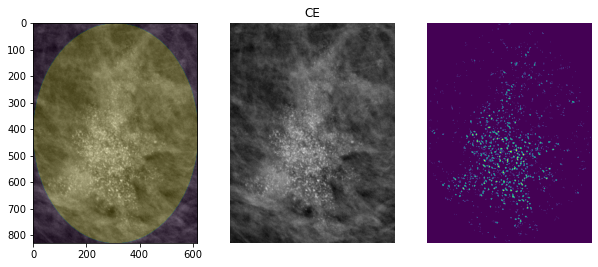

22670978


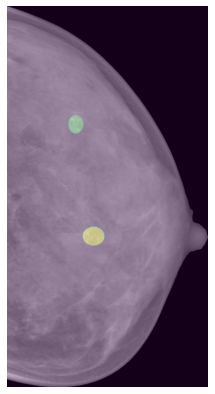

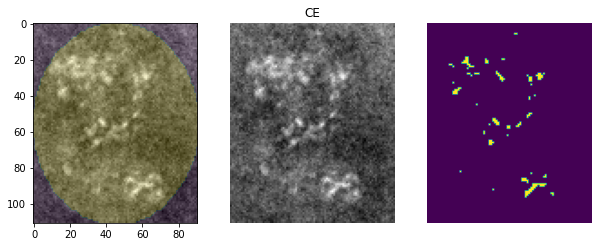

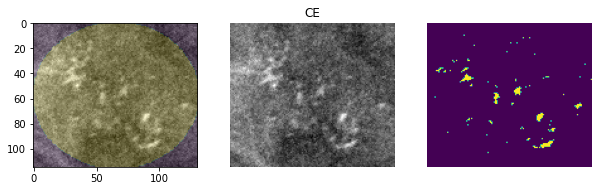

22671003


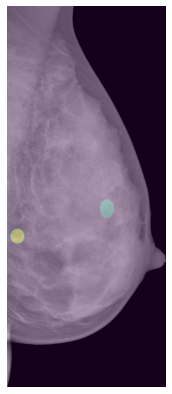

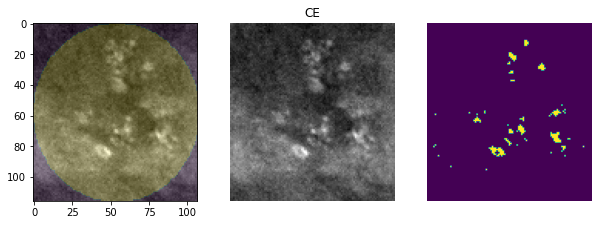

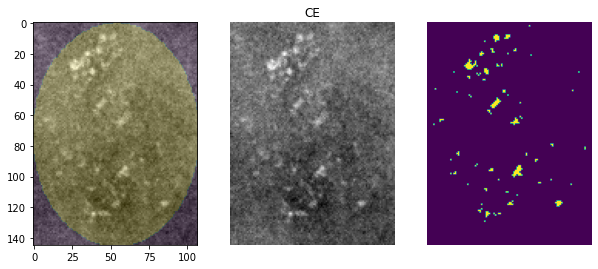

22678953


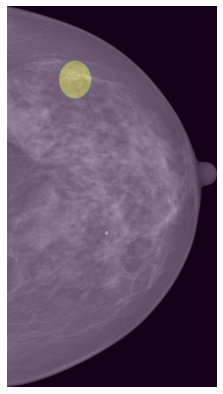

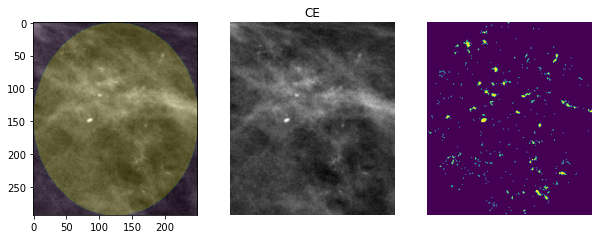

22679008


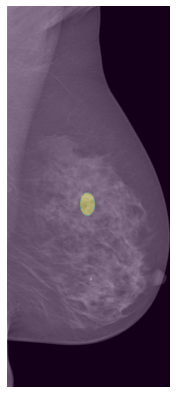

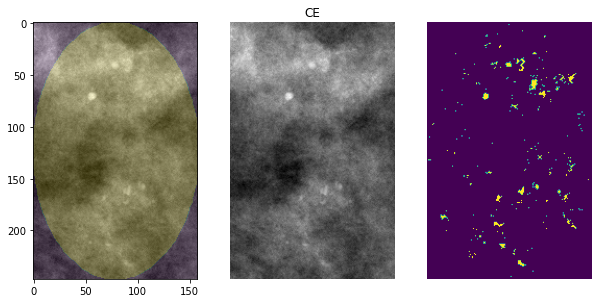

24055149


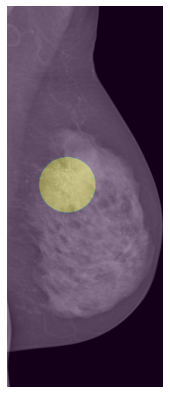

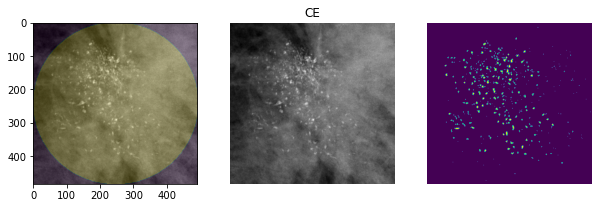

24055203


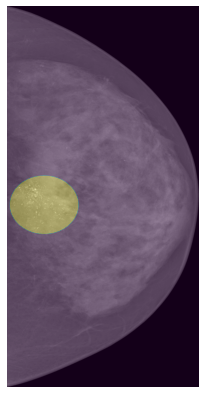

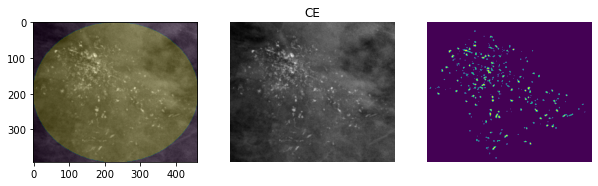

26933801


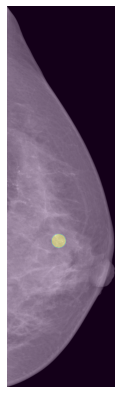

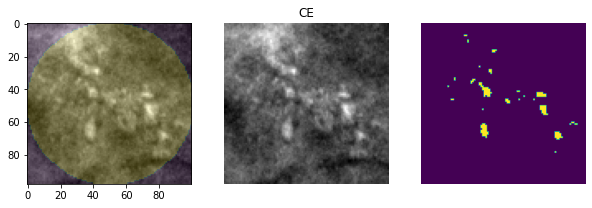

26933859


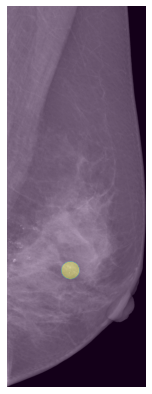

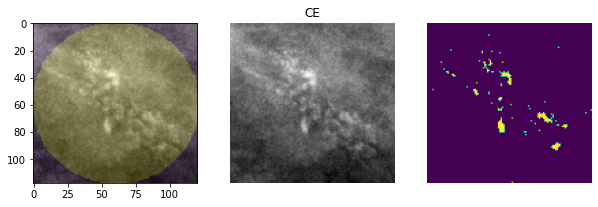

30011824


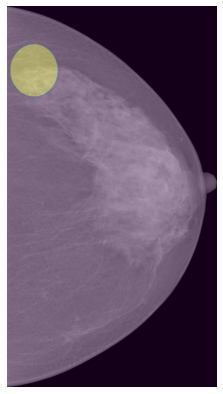

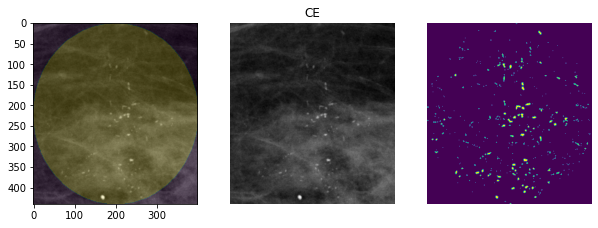

30318067


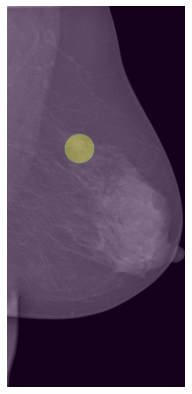

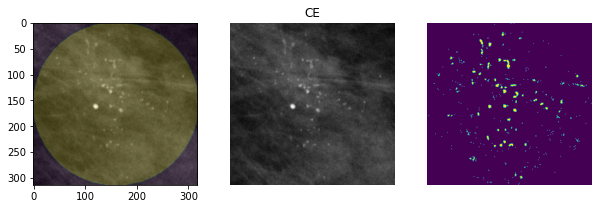

50993399


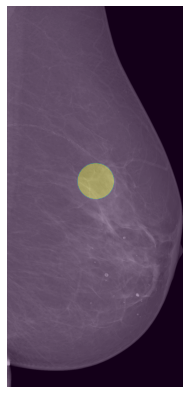

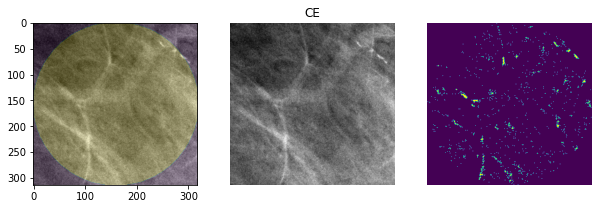

50994841


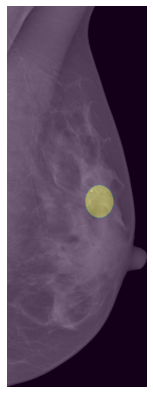

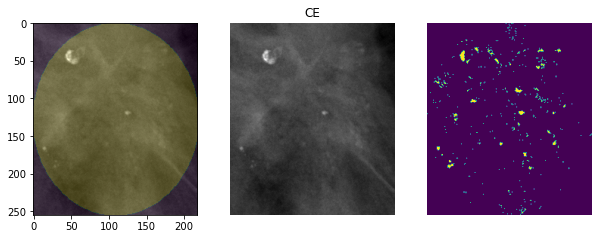

50994895


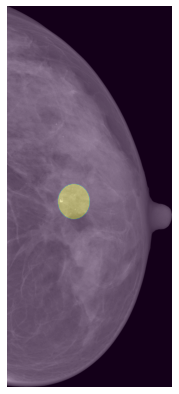

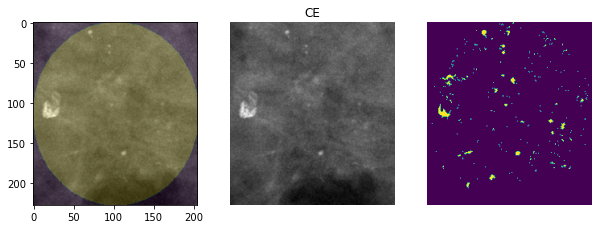

51070197


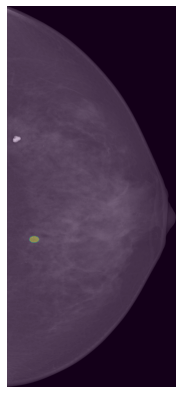

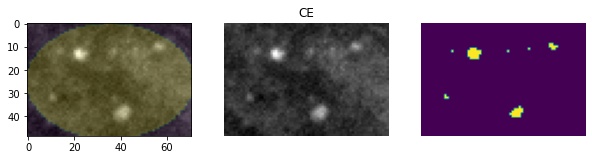

In [8]:
from general_utils.dehazing import dehaze
from skimage import restoration

for k, image_id in enumerate(db.rois_df.loc[db.rois_df.radius > 20, 'img_id'].unique()):
    print(image_id)
    index = db.df.loc[db.df.img_id==image_id].index[0]
    
    img = db[index]['img']
    mask = db[index]['lesion_mask']

    plt.figure(figsize=(7,7))
    plt.imshow(utils.min_max_norm(img, 255).astype('uint8'), cmap='gray')
    plt.imshow(utils.min_max_norm(mask, 255).astype('uint8'), alpha=0.3)
    plt.axis('off')
    plt.show()
    
    clust_idx = np.unique(mask)[1:]
    bboxes = []
    
    idxs = db.rois_df.loc[(db.rois_df.radius > 20) & ( db.rois_df.img_id==image_id), 'index_in_image'].tolist()
    
    for i in idxs:
        r, c = np.where(mask == i)
        bbox = ((c.min(), r.min()), (c.max(), r.max()))
    
        c1 = img[bbox[0][1]:bbox[1][1], bbox[0][0]:bbox[1][0]]
        c1_m = mask[bbox[0][1]:bbox[1][1], bbox[0][0]:bbox[1][0]]


        t = np.percentile(c1[np.where(c1_m)], 95)

        rbd = reconstruction_by_dialation(c1, 3, 7)
        t_rbd = np.percentile(rbd[np.where(c1_m)], 98)

        ad_th = cv2.adaptiveThreshold(
            utils.min_max_norm(c1, 255).astype('uint8'), 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 55, 0)

        DEHAZING_PARAMS = {'omega': 0.9, 'window_size': 11, 'radius': 2, 'eps': 1e-5}
        normalized_image = utils.min_max_norm(c1, max_val=1).astype('float32')
        dehazed_image = dehaze(normalized_image, **DEHAZING_PARAMS)
        background = restoration.rolling_ball(dehazed_image, radius=50)
        background_substracted = dehazed_image - background

        t_ce = np.percentile(dehazed_image[np.where(c1_m)], 90)

        weak_label = np.where(rbd>t_rbd, 255, 0).astype('uint8')
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, ksize=(3,3))
        weak_label = cv2.morphologyEx(weak_label, cv2.MORPH_CLOSE, kernel)
        weak_label = np.where(weak_label>0, 1, 0)

        plt.figure(figsize=(10, 5))
        plt.subplot(131)
        plt.imshow(c1, cmap='gray')
        plt.imshow(c1_m, alpha=0.2)
        # plt.axis('off')
        plt.subplot(132)
        plt.title('CE')
        plt.imshow(c1, cmap='gray')
        plt.axis('off')
        plt.subplot(133)
        plt.imshow(np.where(c1_m>0, 1, 0) & weak_label)
        plt.axis('off')

        plt.show()

In [ ]:
        # plt.figure(figsize=(15, 15))
        # plt.subplot(331)
        # plt.imshow(c1, cmap='gray')
        # plt.imshow(c1_m, alpha=0.2)
        # plt.axis('off')
        # plt.subplot(332)
        # plt.title('CE')
        # plt.imshow(dehazed_image, cmap='gray')
        # plt.axis('off')
        # plt.subplot(333)
        # plt.imshow(np.where(dehazed_image>t_ce, 255, 0))
        # plt.axis('off')

        # plt.subplot(334)
        # plt.imshow(c1, cmap='gray')
        # plt.imshow(c1_m, alpha=0.2)
        # plt.axis('off')
        # plt.subplot(335)
        # plt.title('RBD')
        # plt.imshow(rbd, cmap='gray')
        # plt.axis('off')
        # plt.subplot(336)
        # plt.imshow(np.where(rbd>t_rbd, 255, 0))
        # plt.axis('off')

        # plt.subplot(337)
        # plt.imshow(c1, cmap='gray')
        # plt.imshow(c1_m, alpha=0.2)
        # plt.axis('off')
        # plt.subplot(338)
        # plt.title('simple threshold')
        # plt.imshow(c1, cmap='gray')
        # plt.subplot(339)
        # plt.imshow(np.where(c1>t, 255, 0))
        # plt.axis('off')
        # plt.show()